In [97]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np

In [2]:
# Read in data
data = pd.read_excel(io='Mortgage Customer Data_PPI_Crosssell_Analysis_v1.1.xlsx', sheet_name='Data', header=0)

In [3]:
# Print no. of rows and columns in the dataframe
print('The dimension of dataframe:', data.shape)

The dimension of dataframe: (16383, 59)


In [4]:
# Drop column 'Ref' as it is just Sl. No.
data.drop(columns='Ref', axis=1, inplace=True)

In [5]:
# Column classes of dataframe
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16383 entries, 0 to 16382
Data columns (total 58 columns):
Credit_Score                        16383 non-null int64
Final_Grade                         16383 non-null object
Term                                16383 non-null int64
Net_Advance                         16383 non-null float64
APR                                 16383 non-null float64
Loan_Type                           16383 non-null object
Mosaic                              16383 non-null int64
Mosaic_Class                        16383 non-null int64
Time_at_Address                     16383 non-null int64
Residential_Status                  16383 non-null object
Telephone_Indicator                 16383 non-null object
Number_of_Dependants                16383 non-null int64
Marital_Status                      16383 non-null object
Gender                              16383 non-null object
Time_in_Employment                  16383 non-null int64
Employment_Status         

In [47]:
# Format few columns as character
data[['Mosaic', 'Mosaic_Class', 'code']] = data[['Mosaic', 'Mosaic_Class', 'code']].astype(dtype='object')

# Make category column uppercase
data['category'] = data['category'].str.upper()

In [7]:
# Look at the basic descriptive stats for categorical variables (i.e., number of unique values, most frequently occurring etc.)
data.select_dtypes(include='object').describe().T

,count,unique,top,freq
Final_Grade,16383,10,A,4538
Loan_Type,16383,2,UnSecured,13054
Mosaic,16383,63,23,1005
Mosaic_Class,16383,12,4,3134
Residential_Status,16383,4,H,12572
Telephone_Indicator,16383,2,Y,15241
Marital_Status,16383,4,M,9432
Gender,16383,2,M,9770
Employment_Status,16383,9,P,10118
Full_Part_Time_Empl_Ind,16383,2,F,16308


In [8]:
# Look at the basic descriptive stats for numerical variables (i.e., 5-point summary, mean, sd etc.)
data.select_dtypes(exclude='object').describe().T

,count,mean,std,min,25%,50%,75%,max
Credit_Score,16383.0,882.061832,93.149605,352.0,818.0,882.0,947.0,1295.0
Term,16383.0,59.142892,26.689123,6.0,48.0,60.0,60.0,300.0
Net_Advance,16383.0,7364.007758,6673.343595,500.0,3000.0,5300.0,9000.0,75000.0
APR,16383.0,18.754587,9.662504,0.0,9.9,16.9,24.9,50.4
Time_at_Address,16383.0,120.488128,109.192185,1.0,38.0,84.0,180.0,864.0
Number_of_Dependants,16383.0,0.808460,1.118947,0.0,0.0,0.0,1.0,30.0
Time_in_Employment,16383.0,103.096075,91.541972,0.0,38.0,72.0,144.0,600.0
Income_Range,16383.0,4.408716,1.668857,0.0,3.0,5.0,6.0,6.0
Time_with_Bank,16383.0,194.491119,107.144729,0.0,120.0,181.0,252.0,756.0
Value_of_Property,16383.0,166366.301288,118720.949422,1.0,120000.0,125000.0,190000.0,3300000.0


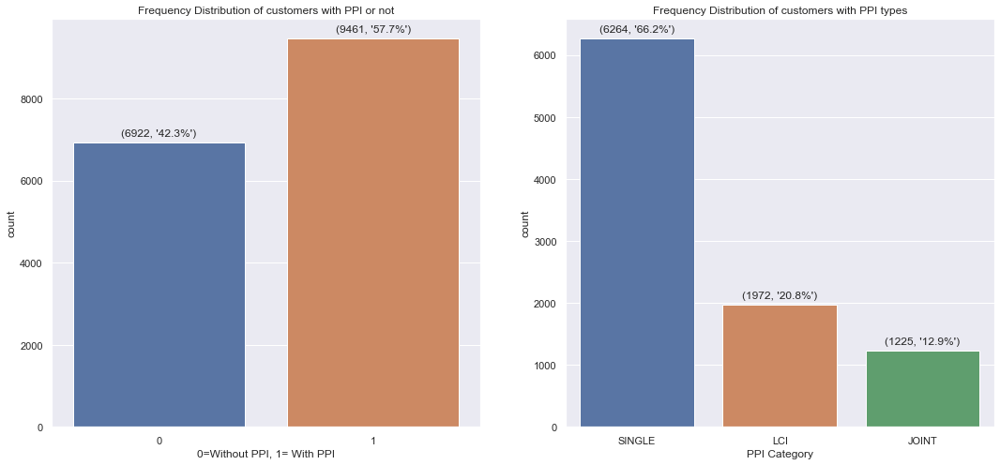

In [9]:
# Bank wants cross-sell the personal protection insurance (PPI) product to those customers
# who have a secured or unsecured type of loan, but no PPI product as yet

sns.set()
fig, ax = plt.subplots(1, 2, figsize=(18, 8))

plt0 = sns.countplot(x=data['PPI'], order = data['PPI'].value_counts().sort_values(ascending=True).index, ax=ax[0])
prop = data['PPI'].value_counts().sort_values(ascending=True)/data['PPI'].count()
_ = plt0.set_title('Frequency Distribution of customers with PPI or not')
_ = plt0.set(xlabel='0=Without PPI, 1= With PPI')

for p, label in zip(plt0.patches, prop):
    plt0.annotate((p.get_height(), format(label, '.1%')), (p.get_x() + p.get_width() / 2., \
        p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

#*****************************************************************

PPIcateg = data.loc[~data['category'].isna(),'category'].str.upper()
plt1 = sns.countplot(x=PPIcateg, order = PPIcateg.value_counts().index, ax=ax[1])
prop = PPIcateg.value_counts()/PPIcateg.shape[0]
_ = plt1.set_title('Frequency Distribution of customers with PPI types')
_ = plt1.set(xlabel='PPI Category')

for p, label in zip(plt1.patches, prop):
    plt1.annotate((p.get_height(), format(label, '.1%')), (p.get_x() + p.get_width() / 2., \
        p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

- ~58% of customers in the customer portfolio purchased PPI
- Among these customers who purchased PPI, majority of customers (~66%) bought single PPI, while ~21% and ~13% bought LCI and Joint PPI respectively

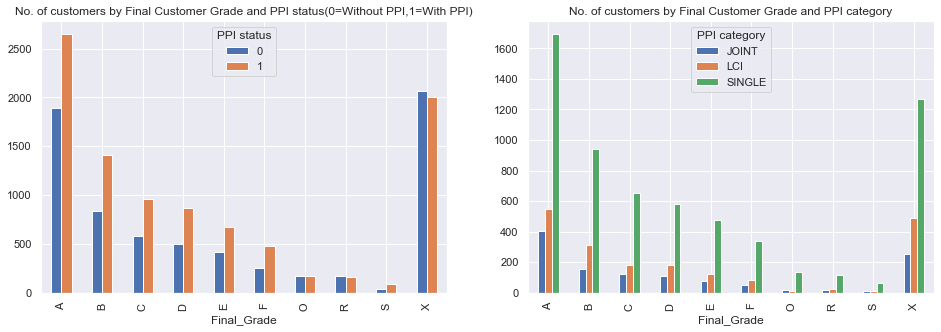

In [71]:
sns.set()
fig, ax = plt.subplots(1, 2, figsize=(16,5))

# Credit score based Final Customer Grade vs PPI status
_ = pd.crosstab(data['Final_Grade'], data['PPI']).plot.bar(ax=ax[0])
_ = ax[0].set_title('No. of customers by Final Customer Grade and PPI status(0=Without PPI,1=With PPI)')
_ = ax[0].legend(title='PPI status', loc='upper center')

# Credit score based Final Customer Grade vs PPI category
_ = pd.crosstab(data.loc[~data['category'].isna(),'Final_Grade'], data.loc[~data['category'].isna(),'category']).plot.bar(ax=ax[1])
_ = ax[1].set_title('No. of customers by Final Customer Grade and PPI category')
_ = ax[1].legend(title='PPI category', loc='upper center')

- Grade A tends to be have majority of customers followed by Grade X, B, C, D, E and F. Typically customers with PPI are more than those without PPI within each final grade except for grades O, R and X.
- Single PPI cases are most common followed by LCI and Joint PPI Cases within each grade

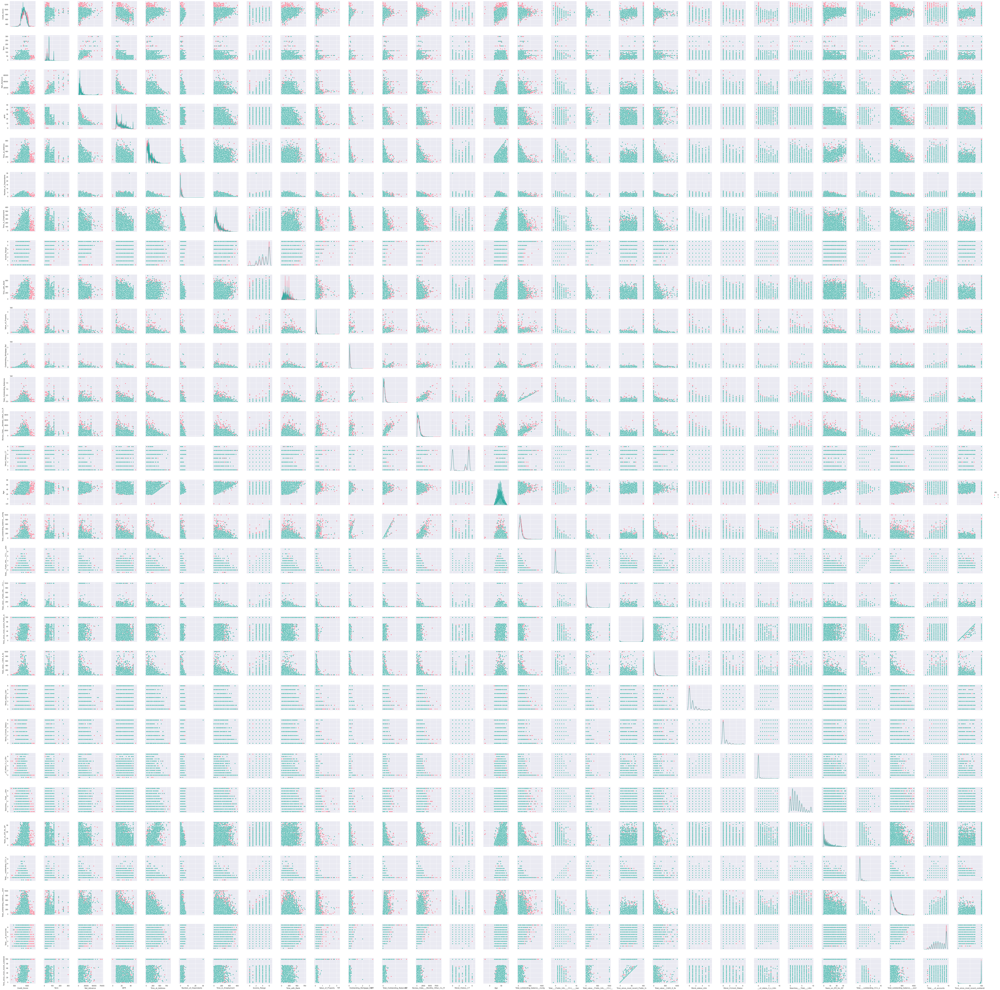

In [44]:
# Look at the distribution of numerical variables conditioned on PPI status
numCols = data.select_dtypes(exclude='object').columns

numCols = numCols[list(map(lambda x: not x.startswith('PPI'), numCols))]
numCols = numCols.insert(0,'PPI')

_ = sns.pairplot(data=data[numCols], hue='PPI', height=3, palette='husl', plot_kws={'edgecolor':'white'}, \
                 diag_kws={'shade':False, 'bw':0.2})

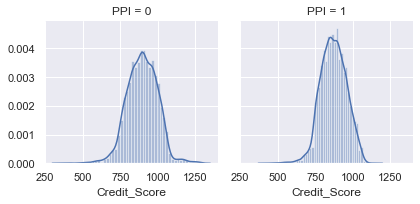

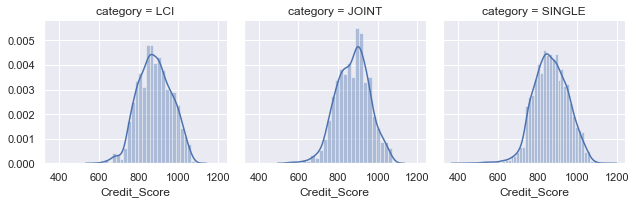

In [48]:
# Look at distribution of credit scores within each cohort of PPI status
g = sns.FacetGrid(data[['PPI','Credit_Score']], col='PPI')
_ = g.map(sns.distplot, 'Credit_Score')

# Look at distribution of credit scores within each cohort of PPI categories
g = sns.FacetGrid(data.loc[~data['category'].isna(), ['Credit_Score', 'category']], col="category")
_ = g.map(sns.distplot, "Credit_Score")

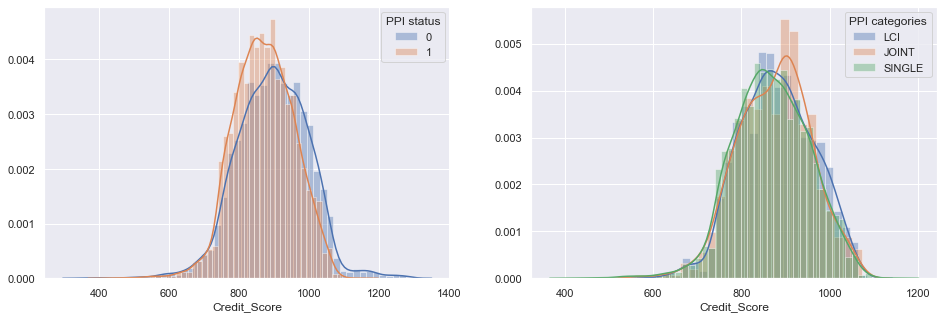

<Figure size 216x216 with 0 Axes>

<Figure size 216x216 with 0 Axes>

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(16, 5))

# Look at distribution of credit scores by PPI status
g = sns.FacetGrid(data[['PPI','Credit_Score']], hue='PPI')
_ = g.map(sns.distplot, 'Credit_Score', ax=ax[0])
_ = ax[0].legend(title='PPI status')
_ = g.fig.delaxes(g.axes[0, 0])

# Look at distribution of credit scores by PPI categories
g = sns.FacetGrid(data.loc[~data['category'].isna(), ['Credit_Score', 'category']], hue='category')
_ = g.map(sns.distplot, "Credit_Score", ax=ax[1])
_ = ax[1].legend(title='PPI categories')
_ = g.fig.delaxes(g.axes[0, 0])

- Customers purchasing PPI has marginally lesser credit score vs customers without PPI
- Among customers who already purchased PPI, customers with Joint PPI has higher credit scores, followed by customers with LCI PPI and Single PPI

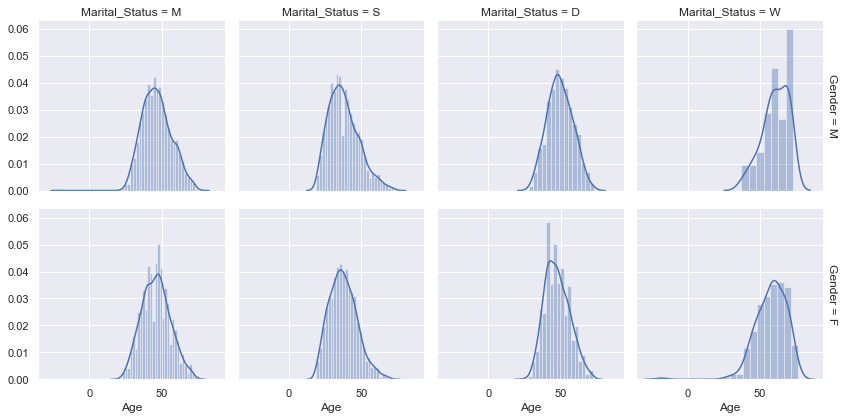

In [55]:
# Bivariate relation among demographic characteristics - Age, Gender, Marital Status
g = sns.FacetGrid(data, row='Gender', col='Marital_Status', margin_titles=True)
_ = g.map(sns.distplot, 'Age')
_ = g.add_legend()

- Not surprisingly widowed customers are in high age bracket (left skewed) while single customers are in low age bracket (right skewed) - more so for the male customers

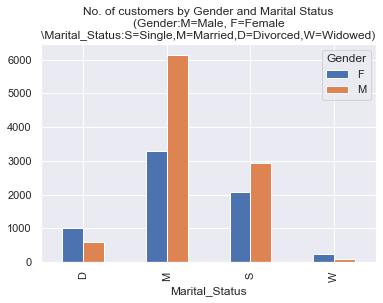

In [69]:
# Gender vs Marital Status
_ = pd.crosstab(data['Marital_Status'], data['Gender']).plot.bar()
_ = plt.title('No. of customers by Gender and Marital Status\n(Gender:M=Male, F=Female\n\Marital_Status:S=Single,M=Married,D=Divorced,W=Widowed)')

- Majority of customers are married, followed by single, divorced and widowed
- Among the single and married customers, male customers are higher in number

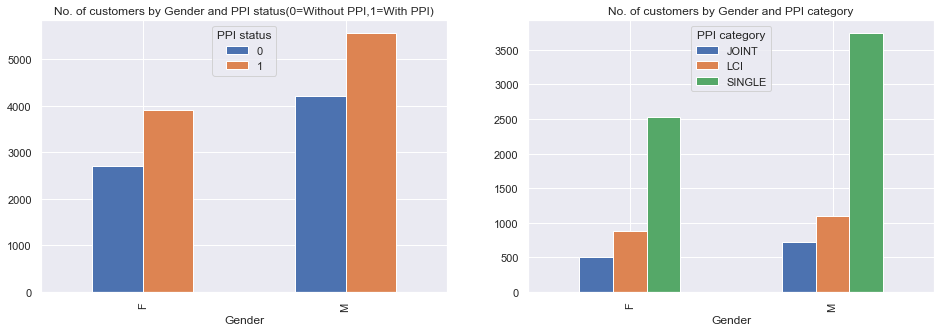

In [83]:
sns.set()
fig, ax = plt.subplots(1, 2, figsize=(16,5))

# Gender vs PPI status
_ = pd.crosstab(data['Gender'], data['PPI']).plot.bar(ax=ax[0])
_ = ax[0].set_title('No. of customers by Gender and PPI status(0=Without PPI,1=With PPI)')
_ = ax[0].legend(title='PPI status', loc='upper center')

# Gender vs PPI category
_ = pd.crosstab(data.loc[~data['category'].isna(),'Gender'], data.loc[~data['category'].isna(),'category']).plot.bar(ax=ax[1])
_ = ax[1].set_title('No. of customers by Gender and PPI category')
_ = ax[1].legend(title='PPI category', loc='upper center')

- PPI has been bought by customers irrespective of genders
- Among PPI customers, distribution of PPI categories among males and females are similar
- So Gender is not a differentiator for PPI

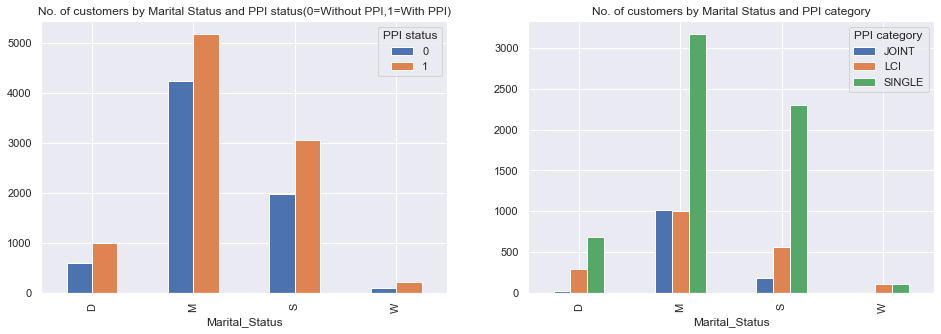

In [81]:
fig, ax = plt.subplots(1, 2, figsize=(16,5))

# Marital Status vs PPI status
_ = pd.crosstab(data['Marital_Status'], data['PPI']).plot.bar(ax=ax[0])
_ = ax[0].set_title('No. of customers by Marital Status and PPI status(0=Without PPI,1=With PPI)')
_ = ax[0].legend(title='PPI status', loc='upper right')

# Marital Status vs PPI category
_ = pd.crosstab(data.loc[~data['category'].isna(),'Marital_Status'], data.loc[~data['category'].isna(),'category']).plot.bar(ax=ax[1])
_ = ax[1].set_title('No. of customers by Marital Status and PPI category')
_ = ax[1].legend(title='PPI category', loc='upper right')

- There are more PPI customers vs non-PPI customers across various marital status categories
- Among PPI customers, most of them are single PPI customers across single, divorced and widowed customers

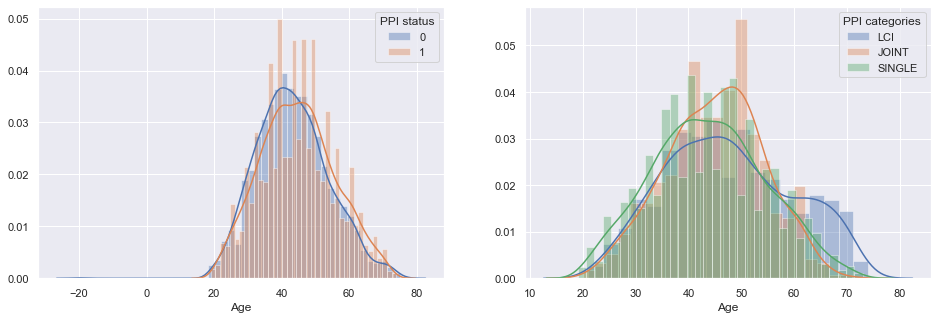

<Figure size 216x216 with 0 Axes>

<Figure size 216x216 with 0 Axes>

In [86]:
fig, ax = plt.subplots(1, 2, figsize=(16, 5))

# Look at distribution of credit scores by PPI status
g = sns.FacetGrid(data[['PPI','Age']], hue='PPI')
_ = g.map(sns.distplot, 'Age', ax=ax[0])
_ = ax[0].legend(title='PPI status')
_ = g.fig.delaxes(g.axes[0, 0])

# Look at distribution of credit scores by PPI categories
g = sns.FacetGrid(data.loc[~data['category'].isna(), ['Age', 'category']], hue='category')
_ = g.map(sns.distplot, 'Age', ax=ax[1])
_ = ax[1].legend(title='PPI categories')
_ = g.fig.delaxes(g.axes[0, 0])

- In general, Age doesn't seem to be too different across PPI status or categories
- Loan customers without PPI seem to be a bit younger
- Also, Joint PPI customers seem to be bit olders vs Single PPI customers

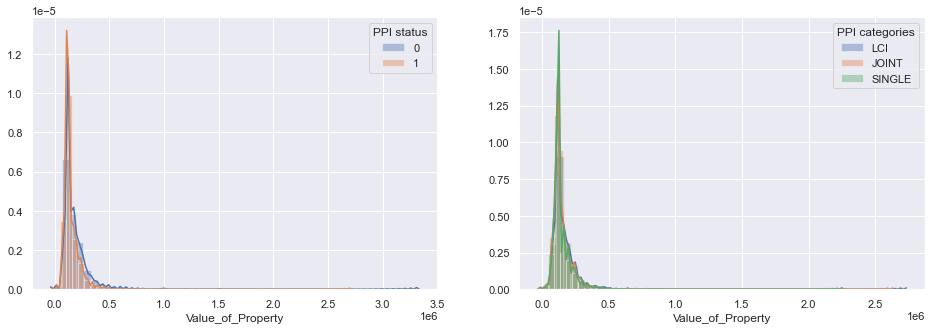

<Figure size 216x216 with 0 Axes>

<Figure size 216x216 with 0 Axes>

In [87]:
fig, ax = plt.subplots(1, 2, figsize=(16, 5))

# Look at distribution of property values by PPI status
g = sns.FacetGrid(data[['PPI','Value_of_Property']], hue='PPI')
_ = g.map(sns.distplot, 'Value_of_Property', ax=ax[0])
_ = ax[0].legend(title='PPI status')
_ = g.fig.delaxes(g.axes[0, 0])

# Look at distribution of property values by PPI categories
g = sns.FacetGrid(data.loc[~data['category'].isna(), ['Value_of_Property', 'category']], hue='category')
_ = g.map(sns.distplot, "Value_of_Property", ax=ax[1])
_ = ax[1].legend(title='PPI categories')
_ = g.fig.delaxes(g.axes[0, 0])

- Looking at the distribution of property values by PPI status and that by PPI categories, there is not much to choose
- We can try binning: Group property value: 1=[1,120K], 2=[120001, 300K], 3=[$300001,$500K], 4=[$500001,inf], say

In [105]:
conditions = [
    (data['Value_of_Property'] <= 120000),
    (data['Value_of_Property'] > 120000) & (data['Value_of_Property'] <= 300000),
    (data['Value_of_Property'] > 300000) & (data['Value_of_Property'] <= 500000),
    (data['Value_of_Property'] > 500000)
    ]

# create a list of the values we want to assign for each condition
values = ['PropValue_4', 'PropValue_3', 'PropValue_2', 'PropValue_1']

# create a new column and use np.select to assign values to it using our lists as arguments
data['PropValue_Tier'] = np.select(conditions, values)

In [106]:
data['PropValue_Tier'].value_counts()

PropValue_4    7887
PropValue_3    7488
PropValue_2     790
PropValue_1     218
Name: PropValue_Tier, dtype: int64

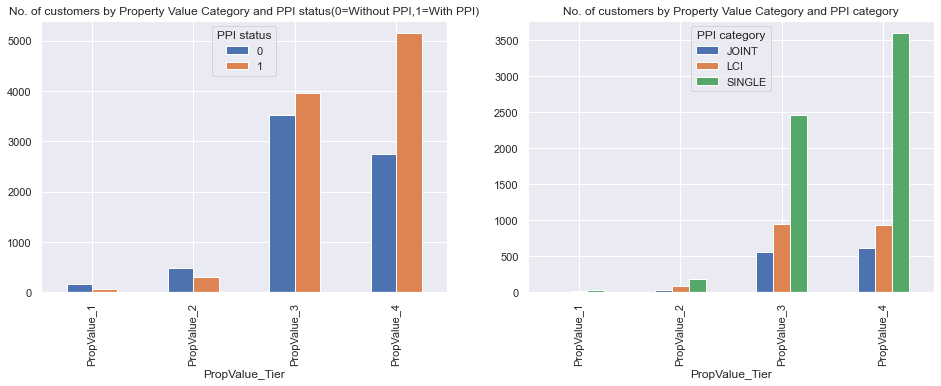

In [107]:
fig, ax = plt.subplots(1, 2, figsize=(16,5))

# Property Value category vs PPI status
_ = pd.crosstab(data['PropValue_Tier'], data['PPI']).plot.bar(ax=ax[0])
_ = ax[0].set_title('No. of customers by Property Value Category and PPI status(0=Without PPI,1=With PPI)')
_ = ax[0].legend(title='PPI status', loc='upper center')

# Property Value category vs PPI category
_ = pd.crosstab(data.loc[~data['category'].isna(),'PropValue_Tier'], data.loc[~data['category'].isna(),'category']).plot.bar(ax=ax[1])
_ = ax[1].set_title('No. of customers by Property Value Category and PPI category')
_ = ax[1].legend(title='PPI category', loc='upper center')


Property Value has long tail to the right side indicating right-skewness; Skew= 8.29


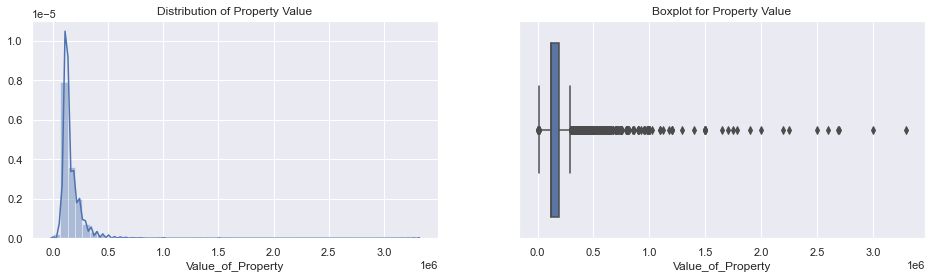

In [137]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
sns.distplot(a=data['Value_of_Property'], ax=ax[0]).set_title('Distribution of Property Value')
sns.boxplot(x=data['Value_of_Property'], ax=ax[1]).set_title("Boxplot for Property Value")

print('\nProperty Value has long tail to the right side indicating right-skewness; Skew=',round(data['Value_of_Property'].skew(),2))

In [138]:
# Let's bin property value by quantiles
PropValue_Tier = ['PropValue_Tier5', 'PropValue_Tier4', 'PropValue_Tier3', 'PropValue_Tier2', 'PropValue_Tier1']
data['PropValue_Tier'] = pd.qcut(data['Value_of_Property'], q=[0, .2, .4, .6, .8, 1], labels=PropValue_Tier)

In [142]:
# distribution and cut-off values of Property Value Tiers
print('Count of records by Property Value Tiers:')
print(data['PropValue_Tier'].value_counts())
print('\nQuantiles (Quintile) of Property Value:')
print(data['Value_of_Property'].quantile(q=[0,0.2,0.4,0.6,0.8,1]))

Count of records by Property Value Tiers:
PropValue_Tier4    4589
PropValue_Tier5    3298
PropValue_Tier1    3267
PropValue_Tier2    2858
PropValue_Tier3    2371
Name: PropValue_Tier, dtype: int64

Quantiles (Quintile) of Property Value:
0.0          1.0
0.2     116000.0
0.4     120000.0
0.6     150000.0
0.8     203000.0
1.0    3300000.0
Name: Value_of_Property, dtype: float64


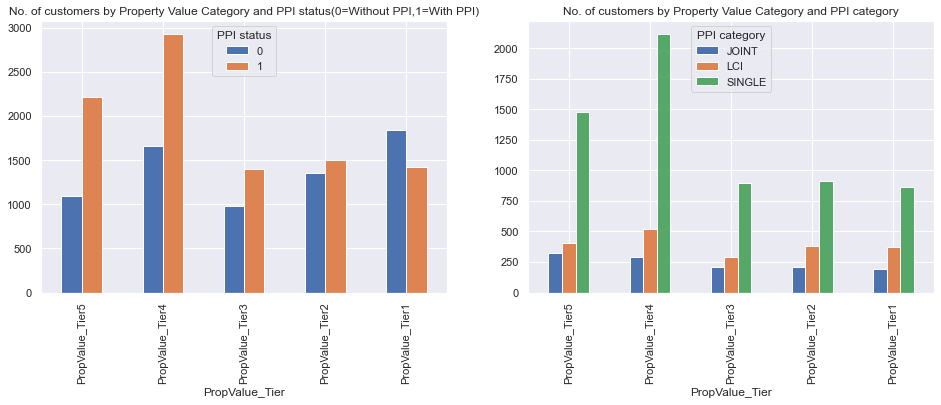

In [111]:
fig, ax = plt.subplots(1, 2, figsize=(16,5))

# Property Value category vs PPI status
_ = pd.crosstab(data['PropValue_Tier'], data['PPI']).plot.bar(ax=ax[0])
_ = ax[0].set_title('No. of customers by Property Value Category and PPI status(0=Without PPI,1=With PPI)')
_ = ax[0].legend(title='PPI status', loc='upper center')

# Property Value category vs PPI category
_ = pd.crosstab(data.loc[~data['category'].isna(),'PropValue_Tier'], data.loc[~data['category'].isna(),'category']).plot.bar(ax=ax[1])
_ = ax[1].set_title('No. of customers by Property Value Category and PPI category')
_ = ax[1].legend(title='PPI category', loc='upper center')

- Defined Property Value Tiers: 
    - Tier 1: >=203K, Tier 2: >=150K & <203K, Tier 3: >=120K & <150K, Tier 4: >=116K & <120K, Tier 5: <116K
- There are more customers without PPI vs those with PPI in the highest tier of property value (>=$203K) compared to the rests of the property value tiers
- Typically customers with single PPI outnumber the other PPI categories (LCI and Joint) across all tiers of property value

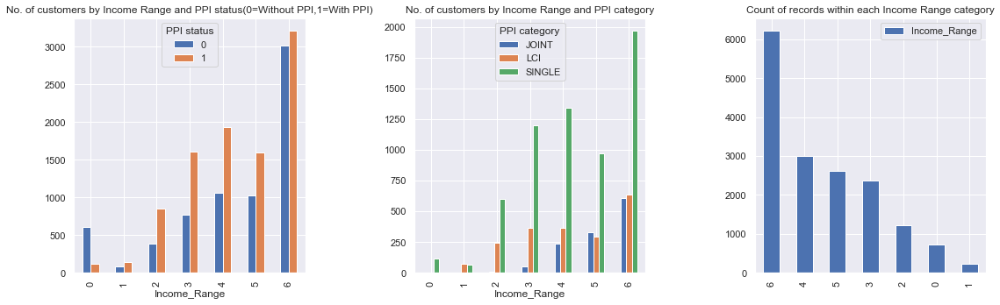

In [151]:
fig, ax = plt.subplots(1, 3, figsize=(16,5))

# Property Value category vs PPI status
_ = pd.crosstab(data['Income_Range'], data['PPI']).plot.bar(ax=ax[0])
_ = ax[0].set_title('No. of customers by Income Range and PPI status(0=Without PPI,1=With PPI)')
_ = ax[0].legend(title='PPI status', loc='upper center')

# Property Value category vs PPI category
_ = pd.crosstab(data.loc[~data['category'].isna(),'Income_Range'], data.loc[~data['category'].isna(),'category']).plot.bar(ax=ax[1])
_ = ax[1].set_title('No. of customers by Income Range and PPI category')
_ = ax[1].legend(title='PPI category', loc='upper center')

# Count of Income Range categories
_ = data['Income_Range'].value_counts().plot.bar(ax=ax[2])
_ = ax[2].set_title('Count of records within each Income Range category')
_ = ax[2].legend()

plt.tight_layout()

- Income Range of 6 is the most common followed by 4,5,3,2,0 and 1
- In general, there are more customers with PPI across income range groups except for Income Range group 0
- Among PPI categories, single PPI customers are majority across all income ranges except for Income Range group 1

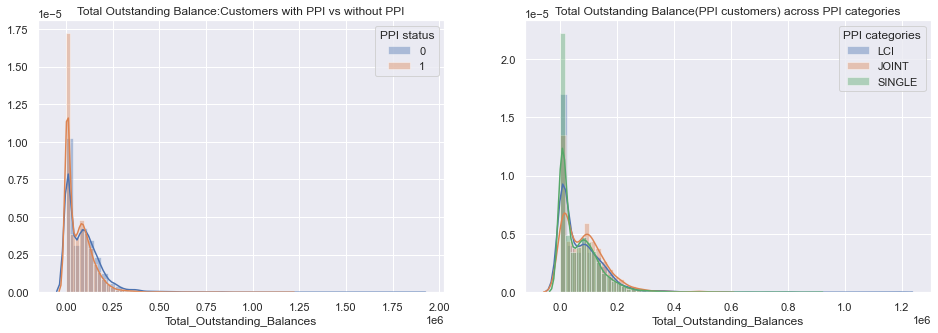

<Figure size 216x216 with 0 Axes>

<Figure size 216x216 with 0 Axes>

In [161]:
fig, ax = plt.subplots(1, 2, figsize=(16, 5))

# Look at distribution of Total Outstanding Balance by PPI status
g = sns.FacetGrid(data[['PPI','Total_Outstanding_Balances']], hue='PPI')
_ = g.map(sns.distplot, 'Total_Outstanding_Balances', ax=ax[0])
_ = ax[0].legend(title='PPI status')
_ = ax[0].set_title('Total Outstanding Balance:Customers with PPI vs without PPI')
_ = g.fig.delaxes(g.axes[0, 0])

# Look at distribution of Total Outstanding Balance by PPI categories
g = sns.FacetGrid(data.loc[~data['category'].isna(), ['Total_Outstanding_Balances', 'category']], hue='category')
_ = g.map(sns.distplot, 'Total_Outstanding_Balances', ax=ax[1])
_ = ax[1].legend(title='PPI categories')
_ = ax[1].set_title('Total Outstanding Balance(PPI customers) across PPI categories')
_ = g.fig.delaxes(g.axes[0, 0])


- Total Outstanding Balance doesn't seem to be too different within cohorts of PPI customers vs non-PPI customers
- Same holds true across PPI categories

In [162]:
# Let's bin property value by quantiles
Balance_Tier = ['Balance_Tier5', 'Balance_Tier4', 'Balance_Tier3', 'Balance_Tier2', 'Balance_Tier1']
data['Balance_Tier'] = pd.qcut(data['Total_Outstanding_Balances'], q=[0, .2, .4, .6, .8, 1], labels=Balance_Tier)

In [163]:
# distribution and cut-off values of Property Value Tiers
print('Count of records by Total Outstanding Balance Tiers:')
print(data['Balance_Tier'].value_counts())
print('\nQuantiles (Quintile) of Total Outstanding Balance Tier:')
print(data['Total_Outstanding_Balances'].quantile(q=[0,0.2,0.4,0.6,0.8,1]))

Count of records by Total Outstanding Balance Tiers:
Balance_Tier1    3277
Balance_Tier3    3277
Balance_Tier5    3277
Balance_Tier2    3276
Balance_Tier4    3276
Name: Balance_Tier, dtype: int64

Quantiles (Quintile) of Total Outstanding Balance Tier:
0.0          0.0
0.2       6456.2
0.4      28986.6
0.6      83290.2
0.8     133330.4
1.0    1876225.0
Name: Total_Outstanding_Balances, dtype: float64


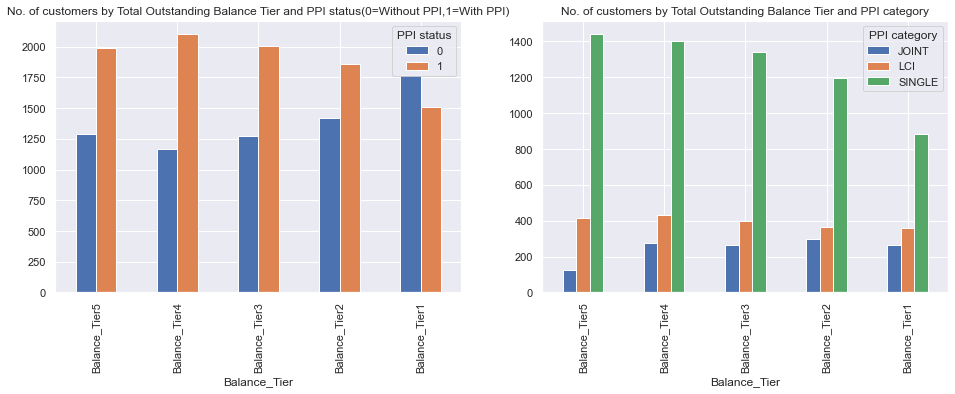

In [166]:
fig, ax = plt.subplots(1, 2, figsize=(16,5))

# Total Outstanding Balance Tier vs PPI status
_ = pd.crosstab(data['Balance_Tier'], data['PPI']).plot.bar(ax=ax[0])
_ = ax[0].set_title('No. of customers by Total Outstanding Balance Tier and PPI status(0=Without PPI,1=With PPI)')
_ = ax[0].legend(title='PPI status', loc='upper right')

# Property Value category vs PPI category
_ = pd.crosstab(data.loc[~data['category'].isna(),'Balance_Tier'], data.loc[~data['category'].isna(),'category']).plot.bar(ax=ax[1])
_ = ax[1].set_title('No. of customers by Total Outstanding Balance Tier and PPI category')
_ = ax[1].legend(title='PPI category', loc='upper right')

- For Balance Tier 1 (Total Outstanding Balance >= 133330), there are more customers without PPI vs customers with PPI